# Temporal Shifts Notebook

This notebook contains an implementation of the FLOSS algorithm for detecting anomalous contextual changes in streaming sensor data in the presence of sensor errors. If multiple sensors zero out in random lengths and in random positions, how well does the algorithm perform? This notebook loads in the data, transforms it and outputs gifs which show the detected regime changes along with the theoretical changepoint. 

## Description of Algorithm
1. Data is loaded in and a subset of the data is picked out (with the same voltages and differing damage levels)
2. A subset of the sensors are picked for their data to be shifted forward by some random number of data points. 
3. At different parts of the data processing pipeline (to be described), the matrix profile and CACs are computed as more sensor data is supplied and updated, and barycentering is (potentially) performed. The resulting stream of CACs is then animated to output a gif.

# Current Notebook/Pipeline Structure 
To create an online regime change predictor, we begin with some base (transformed) data. We create a FLOSS streaming object and update the streaming object with new data. Every 100 points added, we compute the CACs, potentially barycenter CACs together, and the resulting CAC to a window, which then gets animated as a gif. We conduct experiments starting with different base data: 


1. Taking only Sensor 1: 
    - No VMD, only Welch transform. 
    - Yes VMD, Welch transform, and taking only the first VMD mode. 
    - Yes VMD, Welch transform, and barycentering across all 5 VMD modes. 
2. Taking all 24 sensors: 
    - Yes VMD, Welch transform, barycentering across all 5 VMD modes, barycentering across all 24 sensors. 
Each experiment outputs an animation of the CACs changing as we add in more data points dynamically, which we compare with the results of the other positions. 


# Importing Packages

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import stumpy # Matrix Profile
from stumpy.floss import _cac # One sided cac

import ot # Optimal Transport

from vmdpy import VMD # Variational Mode Decomposition 

# Utils
import time
import os
loc = os.getcwd() 

# Matplotlib Params
import matplotlib
font = {'family' : 'DejaVu Sans',
        'weight' : 'bold',
        'size'   : 16}

matplotlib.rc('font', **font)

from matplotlib import animation
from IPython.display import HTML

import scripts

os.chdir('/Users/wang_to/Documents/University/Anomaly_detection/anomalies/bookshelf/dataset')


# Generic Preprocessing Steps (1.1)

In [4]:
data_dict = np.load('data_dict.npy', allow_pickle=True).item()
cases = [['L00','D00','V08'], ['L1C','DB0','V08'],  ['L1C','DBB','V08'], ['L13','DBB','V08']]

# for the first 8 sensors, erase some number of points between 100 and 500.
# for other experiments, see what happens if zeroing out is replaced by random normals
num_sensors = 8
bounds = (1000, 2000)

df_list = scripts.exp_list_process(data_dict, cases, 10)

# loop through the first 8 sensors to zero out.
for i in range(num_sensors):
    sensor_str = f'Sensor{i+1}'
    scripts.temporal_shift(df_list[sensor_str], 8192 , bounds, 25)


From the plot below, we can see the that the data from Sensor 1 has been delayed from arriving between 1000 to 2000 datapoints; the empty space is filled with zeroes.

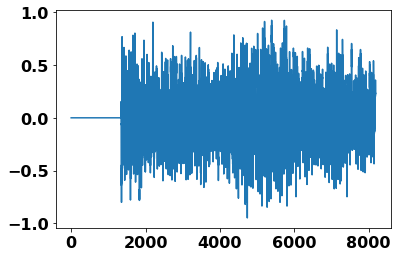

In [28]:
plt.plot(np.array(df_list['Sensor1'].iloc[0,:-8]))

Before we compute the different FLOSS algorithms, we load in some parameters to be used, including the number of experiments used, the parameters for the variational mode decomposition and the welch transform.

In [6]:
# parameters 

alpha = 2000      # Moderate bandwidth constraint  
tau = 0.          # Noise-tolerance (no strict fidelity enforcement)  
num_modes = 5     # Num modes  
DC = 0            # No DC part imposed  
init = 0          # Initialize omegas uniformly  
tol = 1e-7        # Optimization Convergence Tolerance
fs = 1600
# Parameter for p-welch transform
nperseg = df_list['Sensor1'].shape[1]//8

num_experiments = 25 

# Total length of signal recording
signal_length = 8192 # len(X_cols_time)


# Computing FLOSS algorithm for non-VMD (only Welch) 
In this section, we compute the FLOSS algorithm for the processed data only performing the Welch transform on the raw data for Sensor 1 (no VMD). 

In [7]:
building_features = scripts.welch_vmd(df_list['Sensor1'])
building_features_seq = scripts.data_sequencing(building_features, vmd=0)

In [9]:
# Parameters to animate gif 
regime_change_idxs = [n_exp * 513 for n_exp in [10, 15, 20]] # parameter to visualise theoretical regime changes
m = 100 # window size for matrix profiling
L = m
start_list_size = 5*513 # size of the starting set of data points

scripts.animate_regime_change(building_features_seq, 'zero-500_1000-welchonly-10fps.gif', 0, regime_change_idxs, start_list_size, m, L)

The introduction of temporal shifts introduces noise into the CACs, as we can see by the transient 1-frame spikes. However, compared to the main anomaly detection peak, their magnitudes are smaller, and are much shorter lasting. 

# Computing CAC FLOSS algorithm for VMD and VMD CAC (1.1), Sensor 1

In [10]:
# compute the vmd then welch transform of data
# building_features_vmd will be used in other parts of the notebook
building_features_vmd = scripts.welch_vmd(df_list, 8192, nperseg, fs, 5, alpha, tau, DC, init, tol)


Processing Sensor 1
	Processed VMD for Experiment Num (i.e. Data Row) 0
	Processed VMD for Experiment Num (i.e. Data Row) 5
	Processed VMD for Experiment Num (i.e. Data Row) 10
	Processed VMD for Experiment Num (i.e. Data Row) 15
	Processed VMD for Experiment Num (i.e. Data Row) 20
Processing Sensor 2
	Processed VMD for Experiment Num (i.e. Data Row) 0
	Processed VMD for Experiment Num (i.e. Data Row) 5
	Processed VMD for Experiment Num (i.e. Data Row) 10
	Processed VMD for Experiment Num (i.e. Data Row) 15
	Processed VMD for Experiment Num (i.e. Data Row) 20
Processing Sensor 3
	Processed VMD for Experiment Num (i.e. Data Row) 0
	Processed VMD for Experiment Num (i.e. Data Row) 5
	Processed VMD for Experiment Num (i.e. Data Row) 10
	Processed VMD for Experiment Num (i.e. Data Row) 15
	Processed VMD for Experiment Num (i.e. Data Row) 20
Processing Sensor 4
	Processed VMD for Experiment Num (i.e. Data Row) 0
	Processed VMD for Experiment Num (i.e. Data Row) 5
	Processed VMD for Experime

## VMD[0] CACs Sensor 1

In [11]:
# sequence together the transformed vmd
building_features_vmd_seq = scripts.data_sequencing(building_features_vmd, vmd=5)

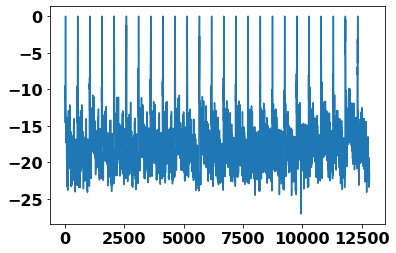

In [29]:
# visualising the concatenated time series
plt.plot(building_features_vmd_seq['Sensor1'][0])

In [12]:
regime_change_idxs = [n_exp*513 for n_exp in [10, 15, 20]]
num_modes = 0
start_list_size = 5 * 513
m = 100 
L = m
scripts.animate_regime_change(building_features_vmd_seq['Sensor1'][0], 'zero-500-1000-VMD_0-welchonly-10fps.gif', num_modes, regime_change_idxs, start_list_size, m, L)



Not much qualitatively changes when we take the first VMD mode as a predictor.

## VMD[all] CACs Sensor 1

In [13]:
regime_change_idxs = [n_exp*513 for n_exp in [10, 15, 20]]
num_modes = 5
start_list_size = 5 * 513
m = 100 
L = m
scripts.animate_regime_change(building_features_vmd_seq['Sensor1'], 'zero-500_1000-VMD_all-welchonly-10fps.gif', num_modes, regime_change_idxs, start_list_size, m, L)

## VMD[all] CACs ALL SENSORS

In [14]:
cac_list = dict() #to store the initial cacs for each mode 
stream = dict()
windows = []

num_sensors = 24
starting_list_size = 5*513

for i in range(num_sensors):
    sensor_str = f'Sensor{i+1}'
    stream[sensor_str] = dict()
    cac_list[sensor_str] = []
    for mode in range(num_modes): 
        vmd_str = f'vmd{mode+1}'
        old_data = building_features_vmd_seq[sensor_str][mode][:starting_list_size] # take the first 5 experiments. There are 25 experiments, with changes occuring in 10, 15, 20 
        mp = stumpy.stump(old_data, m=m)
        cac_list[sensor_str].append(_cac(mp[:, 3], L, bidirectional=False, excl_factor=1))
        vmd_str = f'vmd{mode}'
        stream[sensor_str][vmd_str] = stumpy.floss(mp, old_data, m=m, L=L, excl_factor=1)
    cac_list[sensor_str] = np.array(cac_list[sensor_str])

cac_list = np.array(cac_list)
cac_list = cac_list.item()

# now barycenter cac_list modes together 
building_cacs = scripts.compute_bary_cacs(cac_list, 10, 24, 5)
final_CAC = scripts.final_cac(building_cacs, 24, 1, False)
# this is for the first frame


#now: update, append to window
# for every sensor, for every mode add in 100 points; record the cacs 
cac_list = dict()

for j in range(num_sensors):
    sensor_str = f'Sensor{j+1}'
    cac_list[sensor_str] = dict()


    for mode in range(num_modes):
        k = 0

        vmd_str = f'vmd{mode}'
        cac_list[sensor_str][vmd_str] = dict()

        new_data = building_features_vmd_seq[sensor_str][mode][starting_list_size:]
        current_x_window = list(np.arange(start_list_size))

        for i, t in enumerate(new_data): 
            # cac_list[sensor_str][vmd_str][k] = []

            stream[sensor_str][vmd_str].update(t)
            #update the window of x values we are currently looking at CAC for
            current_x_window = current_x_window[1:]
            current_x_window.append(i+start_list_size)

            
            if i % 100 == 0:# every 100 points, for each mode, update the CAC, barycenter the CACs together for the vmd, then barycenter the sensors together
                #note any indices of regime changes in this x values window
                regime_changes_window_idxs = [0]

                for change in regime_change_idxs:
                    if change in current_x_window:
                        regime_changes_window_idxs.append(current_x_window.index(change))


                cac_list[sensor_str][vmd_str][k] = (stream[sensor_str][vmd_str].T_, stream[sensor_str][vmd_str].cac_1d_)
                #cac_list[sensor_str][vmd_str][k] = np.array(cac_list[sensor_str])
                # each cac_list[sensor_str][vmd_str][k] contains the kth (starting from k=0, corresponding to k*100th points ingested) cac for sensor_str vmd_str

                k += 1 # keeps track of number of 100 points passed 

                # bary_cac = scripts.compute_bary_cacs(cac_list, 10, 24, 5)
                # final_CAC = scripts.final_cac(cac_list, num_sensors=24, subsample_rate=1, average=False)
                # current_cac_1d = np.repeat(final_CAC, 10)
            
                # windows.append((stream['Sensor1']['vmd0'].T_, current_cac_1d, regime_changes_window_idxs)) # this is currently taking the first vmd...



In [15]:
cac_list_vmd = dict()

for sensor in range(num_sensors):
    sensor_str = f'Sensor{sensor+1}'
    cac_list_vmd[sensor_str] = dict()

    for k in range(102):
        OT = [] # contains all vmd for a particular sensor for a particular k

        for vmd in range(num_modes): 
            # compute barycenter among vmd modes
            vmd_str = f'vmd{vmd}'

            kth_cac = cac_list[sensor_str][vmd_str][k][1]
            OT.append(kth_cac)

        OT = np.array(OT)
    
        A = OT.T
        B = A[::10, :]
        M = ot.utils.dist0(B.shape[0])
        M /= M.max()
        M*=1e4

        final_OT = ot.barycenter_unbalanced(B, M, reg=5e-4, reg_m=1e-1) # final OT is the cac for vmd for k = 0
        cac_list_vmd[sensor_str][k] = final_OT


In [16]:
# this should contain a nested dict with each sensor having 128 cacs; the next step is to 
# barycenter across all sensors (keeping k fixed) before appending 
window = dict()

for k in range(102):

    OT = []

    for sensor in range(num_sensors):

        sensor_str = f'Sensor{sensor+1}'
        nth_sensor_cac = cac_list_vmd[sensor_str][k] 
        OT.append(nth_sensor_cac)

    OT = np.array(OT)
    A = OT.T
    B = A[:, :]
    M = ot.utils.dist0(B.shape[0])
    M /= M.max()
    M*=1e4

    final_OT = ot.barycenter_unbalanced(B, M, reg=5e-4, reg_m=1e-1) # final OT is the cac for vmd for k = 0
    window[k] = final_OT# 
    
for k in range(102):
    window[k] = np.repeat(window[k],10)

In [17]:
windows = []
current_x_window = list(np.arange(-100, -100+starting_list_size))
regime_change_idxs = [513*n for n in [10, 15, 20]]
for i in range(102):
    current_x_window = current_x_window[100:]
    last = current_x_window[-1]
    to_concat = list(last +1 + np.arange(100))
    current_x_window = current_x_window + to_concat
    #current_x_window = list(np.concatenate((current_x_window,100*i + np.arange(100) + starting_list_size), axis=0))
    regime_changes_window_idxs = [0]
    for change in regime_change_idxs:
        if change in current_x_window:
            regime_changes_window_idxs.append(current_x_window.index(change))
    windows.append((np.ones(starting_list_size),window[i], regime_changes_window_idxs))


In [18]:

fig, axs = plt.subplots(2, sharex=True, gridspec_kw={'hspace': 0})

axs[0].set_xlim((0, mp.shape[0]))
Y_MIN = min(np.min(old_data), np.min(new_data))
Y_MAX = max(np.max(old_data), np.max(new_data))
axs[0].set_ylim(Y_MIN, Y_MAX)
axs[1].set_xlim((0, mp.shape[0]))
axs[1].set_ylim((-0.1, 1.1))

#legend here^ try

lines = []

for ax in axs: #create empty structures for each frame
    line, = ax.plot([], [], lw=2)
    lines.append(line)
    line, = ax.plot([],[], linewidth=2, color= 'red')
    lines.append(line)
line, = axs[1].plot([], [], lw=2) # create structure for orange curve
lines.append(line)

def init():
    for line in lines:
        line.set_data([], [])
    return lines

def animate(window):
    data_out, cac_out, regime_changes = window
#     for line, data in zip(lines, [data_out, regime_changes, cac_out, regime_changes, cac_1d]):
#         line.set_data(np.arange(data.shape[0]), data)
    lines[0].set_data(np.arange(data_out.shape[0]), data_out)
    lines[2].set_data(np.arange(cac_out.shape[0]), cac_out)
#     lines[4].set_data(np.arange(cac_1d.shape[0]), cac_1d)
    rgm_change = max(regime_changes)
    lines[1].set_data([rgm_change,rgm_change],[Y_MIN, Y_MAX])
    lines[3].set_data([rgm_change,rgm_change],[-0.1, 1.1])
    return lines

anim = animation.FuncAnimation(fig, animate, init_func=init,
                            frames=windows, interval=100,
                            blit=True)

writergif = animation.PillowWriter(fps = 10)

anim_out = anim.to_jshtml()
plt.close()  # Prevents duplicate image from displaying

HTML(anim_out)


We see a large difference in the resulting CAC animation. Regime changes are clearly demarked by the algorithm and the noise characteristic of the previous animations are smoothed out.